<a href="https://colab.research.google.com/github/jean18/INF395-2021-1/blob/main/Tarea1/ANN_2021_1_Taller1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://www.inf.utfsm.cl/images/slides/Departamento-de-Informtica_HORIZONTAL.png" title="Title text" width="80%" />

<hr style="height:2px;border:none"/>
<h1 align='center'> INF-395/477 Redes Neuronales Artificiales I-2021 </h1>

<H3 align='center'> Tarea 1 - Redes Neuronales y Deep Learning </H3>
<hr style="height:2px;border:none"/>

## **Temas**  

* Arquitectura de Redes Neuronales *Feed-Forward*
* Entrenamiento de Redes Neuronales. 
* Parte Básica de Redes Convolucionales. 
* Problemas Especiales.


## **Formalidades**  

* Equipos de trabajo de 3 personas pre-inscritos en sitio por anunciar con un nombre de fantasía que los identifique.
* Formato de entrega: envı́o de link Github y link de video Youtube o plataforma a convenir, todo esto vía Aula. 
* Cada persona debe estar en condiciones de realizar una presentación del trabajo realizado por su equipo y responder preguntas sobre el mismo. El día de la defensa oral serán seleccionados 4-5 presentadores aleatoriamente de entre la clase.
* La tarea tiene 2 partes: una pregunta de investigación donde se evalúa la metodología adoptada y un competencia donde pesa más el resultado y el ranking obtenido. 
* Fecha de Entrega de Código: 28 de Mayo de 2021 23:59:00 Hrs.
* Fecha de Defensa Oral: 28 de Mayo  de 2021 en horario de clases.
* Fecha de Entrega de Video: 30 de Mayo  de 2021 23:59:00 Hrs.

<hr style="height:2px;border:none"/>


## **Entregables**

* Se debe entregar el código utilizado en formato Jupyter/IPython notebook para poder **reproducir los resultados** presentados. El notebook debe estar ordenado para permitir identificar las celdas que a cada parte de la tarea y a las partes más importantes del desarrollo realizado. 

* Se debe preparar un video de **15 a 20 minutos** donde se explique cómo se abordó el taller. En el caso de la pregunta de investigación, se debe explicar muy bien (1) la metodología a utilizar (datasets considerados, pre-procesamiento de datos, arquitecturas a evaluar, parámetros a variar, parámetros a mantener constantes, métricas con las que se evaluará el resultado, etc.), (2) los resultados obtenidos y (3) las conclusiones de la experiencia. En el caso del desafío, se debe narrar brevemente la estrategia de solución adoptada enfocándose en aquello que los autores creen que la hará la solución ganadora. 


****



## **Pregunta de Investigación (60%)**

> **6. Skip Connections**: Añadir skip connections a una red profunda generalmente mejora su desempeño en la tarea de interés.  




### Criterios Experimentales Mínimos

La evidencia experimental que se presenta debe incluir al menos 1 dataset sintético y 2 dataset reales. Para elegir los dataset pueden considerar:

  - **Kaggle**: muchos datasets nuevos e interesantes. *https://www.kaggle.com/datasets*

  - **UCI Machine Learning Repository**: datasets clásicos y la mayoría poco utilizados en deep learning. *https://archive.ics.uci.edu/ml/index.php*

  - **Keras Datasets**: datasets pre-procesados, fáciles de cargar, apropiados para deep learning, pero algo menos originales. *https://keras.io/api/datasets/*

  - **Sklearn Datasets:** datasets pre-procesados y fáciles de cargar, más utilizados en machine learning clásico (no deep) y algo menos originales. *https://scikit-learn.org/stable/datasets/toy_dataset.html*


**Es legítimo modificar un dataset real para buscar probar o demostrar la hipótesis. Por ejemplo: alterar las etiquetas en un problema de clasificación conocido o crear outliers en la salida de un problema de regresión. En estos casos, el dataset califica como real.**



In [3]:
# Librerias
import pandas as pd
import numpy as np
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from scipy.io import loadmat
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPool2D, Conv2D, Flatten, GlobalAveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.utils import to_categorical

### The Street View House Numbers (SVHN) Dataset

* http://ufldl.stanford.edu/housenumbers/

Este es un dataset de mas de 600.000 digitos en total, y es un conjunto de datos mas dificil que el MNIST, ya que las imagenes estan sacadas desde Google Street View.

In [2]:
print("Mounting your Google Drive ...")

from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

# Esta es la ruta en mi drive
path = '/content/drive/MyDrive/Intro a las redes neuronales/Tareas/Tarea 1/'

Mounting your Google Drive ...
Mounted at /content/drive


In [264]:
train = loadmat(path + '/train_32x32.mat')
test = loadmat(path + '/test_32x32.mat')

In [265]:
x_train, y_train = train['X'], train['y']
x_test, y_test = test['X'], test['y']

In [266]:
# shape of data
print('x_train shape: ' + str(x_train.shape))
print('y_train shape: ' + str(y_train.shape))
print('x_test shape: ' + str(x_test.shape))
print('y_test shape: ' + str(y_test.shape))

x_train shape: (32, 32, 3, 73257)
y_train shape: (73257, 1)
x_test shape: (32, 32, 3, 26032)
y_test shape: (26032, 1)


In [267]:
# reshape the data
x_train = np.transpose(x_train, [3, 0, 1, 2]) # from HWCN to NHWC
y_train = np.reshape(y_train, -1) 
x_test = np.transpose(x_test, [3, 0, 1, 2])
y_test = np.reshape(y_test, -1)
print('x_train new shape: ' + str(x_train.shape))
print('y_train new shape: ' + str(y_train.shape))
print('x_test new shape: ' + str(x_test.shape))
print('y_test new shape: ' + str(y_test.shape))

x_train new shape: (73257, 32, 32, 3)
y_train new shape: (73257,)
x_test new shape: (26032, 32, 32, 3)
y_test new shape: (26032,)


In [268]:
# label '0' -> 10
y_train[y_train == 10] = 0
y_test[y_test == 10] = 0

In [269]:
# use one hot enconding
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

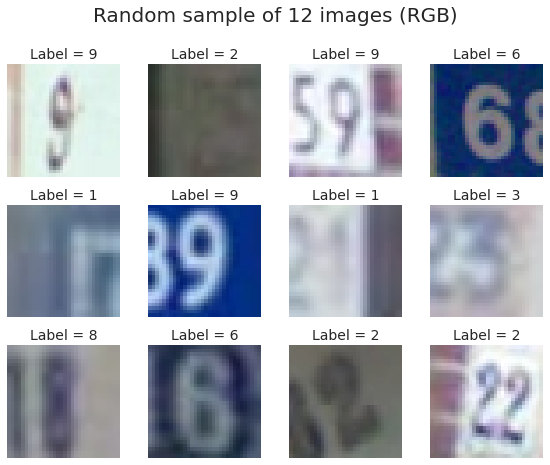

In [270]:
# select a random sample of images and corresponding labels

# create figure (fig), and array of axes (ax)
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(8, 6))

# title
fig.suptitle('Random sample of 12 images (RGB)', fontsize=20, y=1.07)

# Select 12 random images without duplicates (replace=False)
random=np.random.choice(x_train.shape[0], 12, replace=False)

for i, axi in enumerate(ax.flat):

    img = x_train[random[i], :, :, :]
    axi.set_axis_off()
    axi.imshow(img)
    axi.set_title('Label = {}'.format(np.argmax(y_train[random[i]], axis=0)), fontsize=14)

plt.tight_layout()
plt.show()

In [271]:
# convert the training and test images to grayscale and rescale the image values
x_train_gs = np.mean(x_train, axis=-1, keepdims=True)/255.0
x_test_gs = np.mean(x_test, axis=-1, keepdims=True)/255.0

In [272]:
def get_model_1(input_shape):

  inputs = Input(shape=input_shape)

  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(inputs)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = Flatten()(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  outputs = Dense(10, activation='softmax')(h)
                 
  model = Model(inputs=inputs, outputs = outputs)

  model.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

  return model

def get_model_2(input_shape):

  inputs = Input(shape=input_shape)

  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(inputs)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = Flatten()(h)
  output_block_1 = Dense(128, activation='relu')(h)

  h = Dense(128, activation='relu')(output_block_1)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  output_block_2 = tf.keras.layers.add([h, output_block_1])

  h = Dense(128, activation='relu')(output_block_2)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  output_block_3 = tf.keras.layers.add([h, output_block_2])

  h = Dense(128, activation='relu')(output_block_3)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  output_block_4 = tf.keras.layers.add([h, output_block_3])

  h = Dense(128, activation='relu')(output_block_4)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  output_block_5 = tf.keras.layers.add([h, output_block_4])

  h = Dense(128, activation='relu')(output_block_5)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  outputs = Dense(10, activation='softmax')(h)
                 
  model = Model(inputs=inputs, outputs = outputs)

  model.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

  return model


def get_model_3(input_shape):

  inputs = Input(shape=input_shape)

  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(inputs)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = BatchNormalization()(h)
  h = Conv2D(32, (2, 2), activation='relu', padding='SAME')(h)
  h = MaxPool2D((2, 2))(h)
  h = Flatten()(h)
  output_block_1 = Dense(128, activation='relu')(h)

  h = Dense(128, activation='relu')(output_block_1)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  output_block_2 = tf.keras.layers.add([h, output_block_1])

  h = Dense(128, activation='relu')(output_block_2)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  outputs = Dense(10, activation='softmax')(h)
                 
  model = Model(inputs=inputs, outputs = outputs)

  model.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

  return model

In [273]:
# get the model
model1 = get_model_1(x_train_gs[0].shape)
model2 = get_model_2(x_train_gs[0].shape)
model3 = get_model_3(x_train_gs[0].shape)

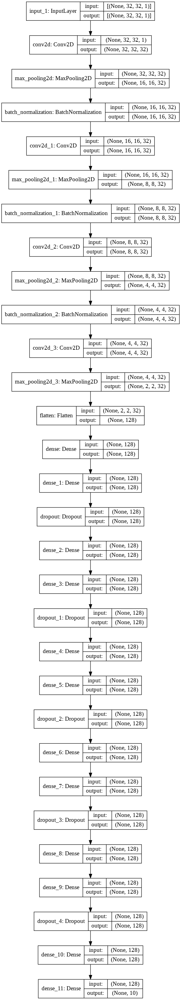

In [14]:
tf.keras.utils.plot_model(model1, to_file='model_1.png', show_shapes=True)

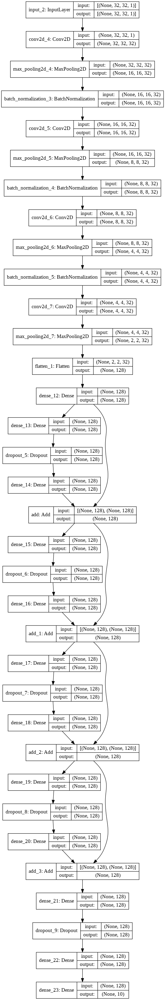

In [15]:
tf.keras.utils.plot_model(model2, to_file='model_2.png', show_shapes=True)

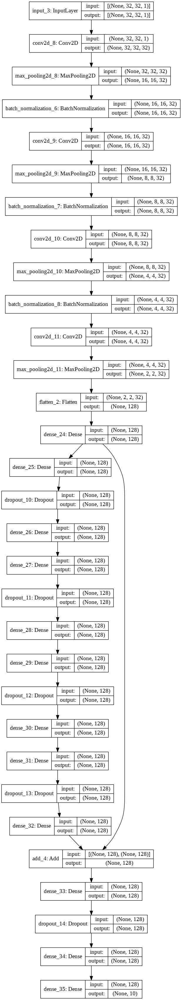

In [16]:
tf.keras.utils.plot_model(model3, to_file='model_3.png', show_shapes=True)

In [262]:
tf.random.set_seed(1)

In [274]:
history_model1 = model1.fit(x_train_gs, y_train, epochs=10, batch_size=128, validation_split=0.15, verbose=False)
history_model2 = model2.fit(x_train_gs, y_train, epochs=10, batch_size=128, validation_split=0.15, verbose=False)
history_model3 = model3.fit(x_train_gs, y_train, epochs=10, batch_size=128, validation_split=0.15, verbose=False)

In [275]:
df1 = pd.DataFrame(history_model1.history)
df2 = pd.DataFrame(history_model2.history)
df3 = pd.DataFrame(history_model3.history)

In [278]:
def plot(df1, df2, df3, x_test, y_test, model1, model2, model3):

  # create figure (fig), and array of axes (ax)
  fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(18, 12))
  ax = ax.flatten()
  fig.suptitle('Learning curves in training set', fontsize=16, y=1.04)

  sns.lineplot(x=df1.index , y='loss', data=df1, ax=ax[0], label='loss')
  sns.lineplot(x=df1.index, y='val_loss', data=df1, ax=ax[0], label='val_loss')
  ax[0].set_title(f'Model 1: Loss vs Epoch, Loss on test set = {np.round(model1.evaluate(x_test, y_test, verbose=False)[0], 3)}', fontsize=13)
  ax[0].set_ylabel('Loss')
  ax[0].set_xlabel('Epoch')

  sns.lineplot(x=df1.index , y='accuracy', data=df1, ax=ax[1], label='acc')
  sns.lineplot(x=df1.index, y='val_accuracy', data=df1, ax=ax[1], label='val_acc')
  ax[1].set_title(f'Model 1: Accuracy vs Epoch, Acc on test set = {np.round(model1.evaluate(x_test, y_test, verbose=False)[1], 3)}', fontsize=13)
  ax[1].set_ylabel('Accuracy')
  ax[1].set_xlabel('Epoch')

  sns.lineplot(x=df2.index , y='loss', data=df2, ax=ax[2], label='loss')
  sns.lineplot(x=df2.index, y='val_loss', data=df2, ax=ax[2], label='val_loss')
  ax[2].set_title(f'Model 2: Loss vs Epoch, Loss on test set = {np.round(model2.evaluate(x_test, y_test, verbose=False)[0], 3)}', fontsize=13)
  ax[2].set_ylabel('Loss')
  ax[2].set_xlabel('Epoch')

  sns.lineplot(x=df2.index , y='accuracy', data=df2, ax=ax[3], label='acc')
  sns.lineplot(x=df2.index, y='val_accuracy', data=df2, ax=ax[3], label='val_acc')
  ax[3].set_title(f'Model 2: Accuracy vs Epoch, Acc on test set = {np.round(model2.evaluate(x_test, y_test, verbose=False)[1], 3)}', fontsize=13)
  ax[3].set_ylabel('Accuracy')
  ax[3].set_xlabel('Epoch')

  sns.lineplot(x=df2.index , y='loss', data=df2, ax=ax[4], label='loss')
  sns.lineplot(x=df2.index, y='val_loss', data=df2, ax=ax[4], label='val_loss')
  ax[4].set_title(f'Model 3: Loss vs Epoch, Loss on test set = {np.round(model3.evaluate(x_test, y_test, verbose=False)[0], 3)}', fontsize=13)
  ax[4].set_ylabel('Loss')
  ax[4].set_xlabel('Epoch')

  sns.lineplot(x=df2.index , y='accuracy', data=df2, ax=ax[5], label='acc')
  sns.lineplot(x=df2.index, y='val_accuracy', data=df2, ax=ax[5], label='val_acc')
  ax[5].set_title(f'Model 3: Accuracy vs Epoch, Acc on test set = {np.round(model3.evaluate(x_test, y_test, verbose=False)[1], 3)}', fontsize=13)
  ax[5].set_ylabel('Accuracy')
  ax[5].set_xlabel('Epoch')

  plt.tight_layout()
  plt.legend()
  plt.show()

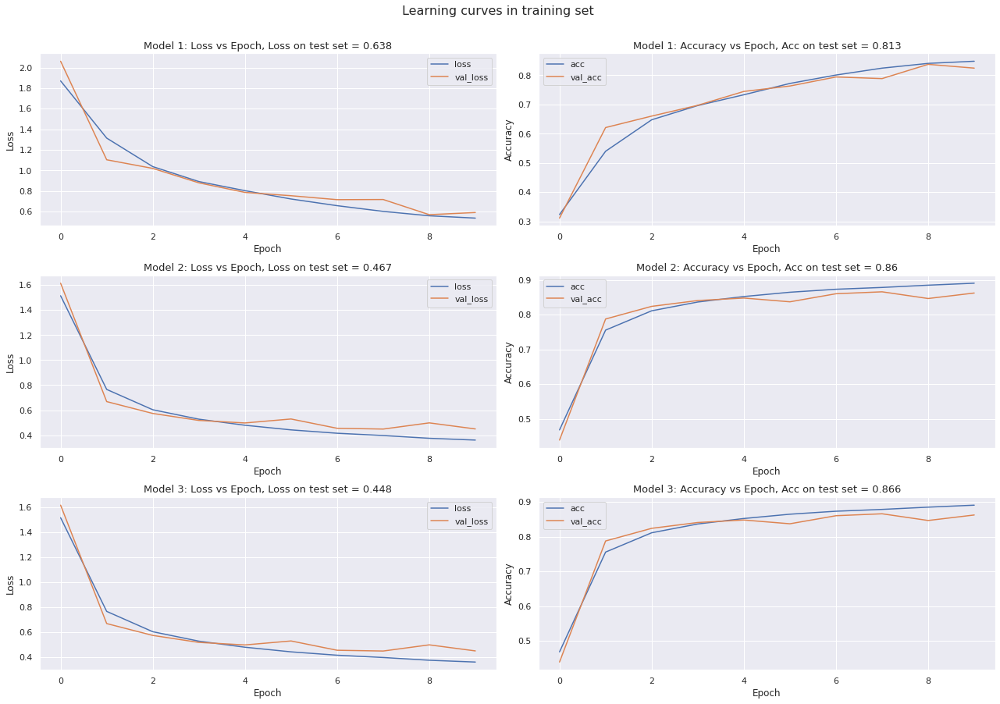

In [279]:
plot(df1, df2, df3, x_test_gs, y_test, model1, model2, model3)

### Acute inflammations dataset

* https://archive.ics.uci.edu/ml/datasets/Acute+Inflammations

The data was created by a medical expert as a data set to test the expert system, which will perform the presumptive diagnosis of two diseases of the urinary system.



Attribute information:

Inputs:
- Temperature of patient : 35C-42C
- Occurrence of nausea : yes/no
- Lumbar pain : yes/no
- Urine pushing (continuous need for urination) : yes/no
- Micturition pains : yes/no
- Burning of urethra, itch, swelling of urethra outlet : yes/no

Outputs:
- decision 1: Inflammation of urinary bladder : yes/no
- decision 2: Nephritis of renal pelvis origin : yes/no

In [126]:
df = pd.read_csv(path + '/diagnosis.csv')
df.head()

,0,1,2,3,4,5,6,7
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0


In [127]:
columns = {'0': 'temp',
           '1': 'nocc',
           '2': 'lumbp',
           '3': 'up',
           '4': 'mict',
           '5': 'bis',
           '6': 'inflam',
           '7': 'nephr'}

In [128]:
df.rename(columns = columns, inplace = True)

In [129]:
df.head()

,temp,nocc,lumbp,up,mict,bis,inflam,nephr
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0


In [130]:
x_train, x_test, y_train, y_test = train_test_split(df.iloc[:, :6], df.iloc[:, 6:], test_size=0.2, random_state=0)

In [133]:
# Separamos los dos outputs
inflam_train, nephr_train = y_train['inflam'], y_train['nephr']
inflam_test, nephr_test = y_test['inflam'], y_test['nephr']

In [197]:
def get_model_1(input_shape):

  inputs = Input(shape=(input_shape,))

  h = Dense(128, activation='relu')(inputs)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  inflammation_pred = Dense(1, activation='sigmoid', name='inflam')(h)

  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  nephritis_pred = Dense(1, activation='sigmoid', name='nephr')(h)

  model = Model(inputs=inputs, outputs=[inflammation_pred, nephritis_pred])

  model.compile(optimizer='rmsprop', 
                loss={'inflam': 'binary_crossentropy',
                      'nephr': 'binary_crossentropy'},
                metrics={'inflam': 'acc', 'nephr': 'acc'},
                loss_weights=[0.7, 0.3])
  
  return model


def get_model_2(input_shape):

  inputs = Input(shape=(input_shape,))

  h = Dense(128, activation='relu')(inputs)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  outputs_block_1 = Dense(128, activation='relu')(h)

  h = BatchNormalization()(outputs_block_1)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  outputs_block_2 = tf.keras.layers.add([h, outputs_block_1])

  h = BatchNormalization()(outputs_block_2)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  outputs_block_3 = tf.keras.layers.add([h, outputs_block_2])

  h = BatchNormalization()(outputs_block_3)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  outputs_block_4 = tf.keras.layers.add([h, outputs_block_3])

  h = BatchNormalization()(outputs_block_4)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  inflammation_pred = Dense(1, activation='sigmoid', name='inflam')(h)

  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  outputs_block_5 = Dense(128, activation='relu')(h)

  h = Dense(128, activation='relu')(outputs_block_5)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  outputs_block_6 = tf.keras.layers.add([h, outputs_block_5])

  h = BatchNormalization()(outputs_block_6)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  nephritis_pred = Dense(1, activation='sigmoid', name='nephr')(h)

  model = Model(inputs=inputs, outputs=[inflammation_pred, nephritis_pred])

  model.compile(optimizer='rmsprop', 
                loss={'inflam': 'binary_crossentropy',
                      'nephr': 'binary_crossentropy'},
                metrics={'inflam': 'acc', 'nephr': 'acc'},
                loss_weights=[0.7, 0.3])
  
  return model


def get_model_3(input_shape):

  inputs = Input(shape=(input_shape,))

  h = Dense(128, activation='relu')(inputs)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  outputs_block_1 = Dense(128, activation='relu')(h)

  h = BatchNormalization()(outputs_block_1)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  outputs_block_2 = tf.keras.layers.add([h, outputs_block_1])

  h = BatchNormalization()(outputs_block_2)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  inflammation_pred = Dense(1, activation='sigmoid', name='inflam')(h)


  outputs_block_3 = Dense(128, activation='relu')(h)
  h = BatchNormalization()(outputs_block_3)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  h = Dense(128, activation='relu')(h)
  h = BatchNormalization()(h)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)
  outputs_block_4 = tf.keras.layers.add([h, outputs_block_3])

  h = BatchNormalization()(outputs_block_4)
  h = Dropout(0.3)(h)
  h = Dense(128, activation='relu')(h)

  nephritis_pred = Dense(1, activation='sigmoid', name='nephr')(h)

  model = Model(inputs=inputs, outputs=[inflammation_pred, nephritis_pred])

  model.compile(optimizer='rmsprop', 
                loss={'inflam': 'binary_crossentropy',
                      'nephr': 'binary_crossentropy'},
                metrics={'inflam': 'acc', 'nephr': 'acc'},
                loss_weights=[0.7, 0.3])
  
  return model

In [198]:
model1 = get_model_1(x_train.shape[1])
model2 = get_model_2(x_train.shape[1])
model3 = get_model_3(x_train.shape[1])

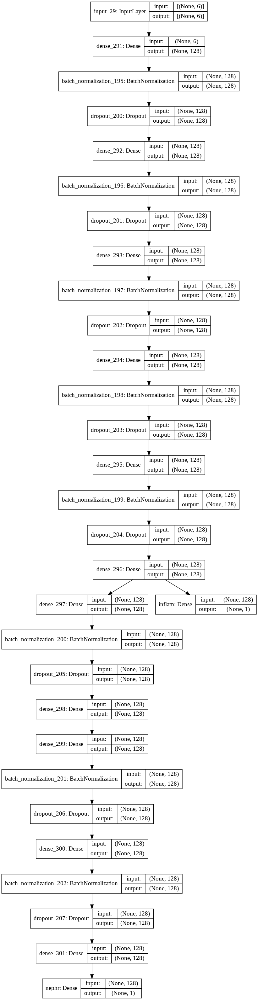

In [191]:
tf.keras.utils.plot_model(model1, to_file='model_1.png', show_shapes=True)

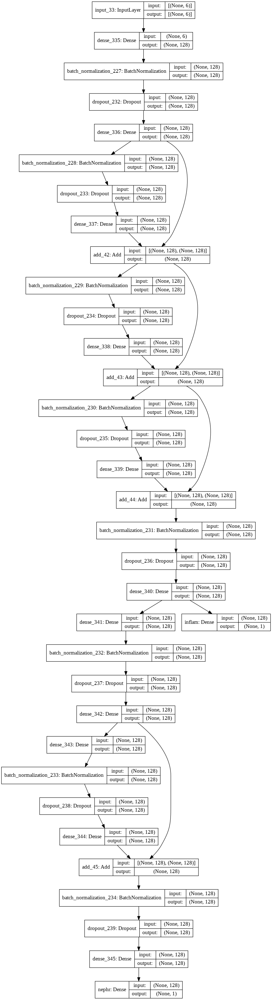

In [195]:
tf.keras.utils.plot_model(model2, to_file='model_2.png', show_shapes=True)

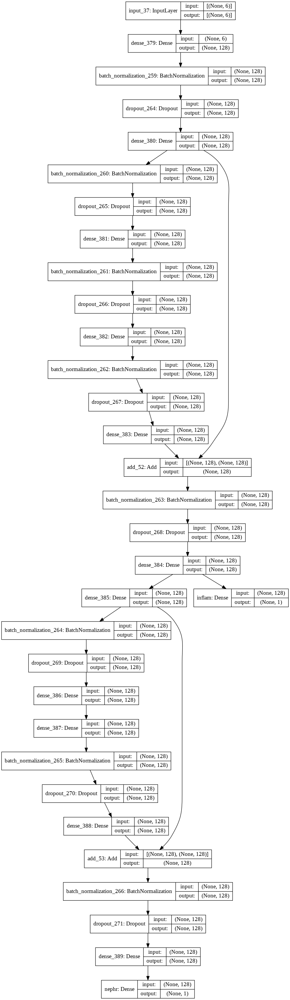

In [199]:
tf.keras.utils.plot_model(model3, to_file='model_3.png', show_shapes=True)

In [251]:
history_model1 = model1.fit(x_train, [inflam_train, nephr_train], epochs=6, batch_size=128, validation_split=0.15, verbose=False)
history_model2 = model2.fit(x_train, [inflam_train, nephr_train], epochs=6, batch_size=128, validation_split=0.15, verbose=False)
history_model3 = model3.fit(x_train, [inflam_train, nephr_train], epochs=6, batch_size=128, validation_split=0.15, verbose=False)

In [252]:
df1 = pd.DataFrame(history_model1.history)
df2 = pd.DataFrame(history_model2.history)
df3 = pd.DataFrame(history_model3.history)

In [253]:
df1

,loss,inflam_loss,nephr_loss,inflam_acc,nephr_acc,val_loss,val_inflam_loss,val_nephr_loss,val_inflam_acc,val_nephr_acc
0,0.090404,0.063078,0.154165,0.975309,0.950617,0.579093,0.556345,0.632172,0.8,0.666667
1,0.107109,0.111328,0.097266,0.975309,0.987654,0.569607,0.543248,0.631111,0.6,0.666667
2,0.074408,0.041902,0.150255,0.987654,0.950617,0.608100,0.594340,0.640206,0.6,0.666667
3,0.066013,0.051499,0.099879,0.987654,0.938272,0.729001,0.754838,0.668714,0.6,0.666667
4,0.090944,0.092332,0.087706,0.987654,0.975309,0.658929,0.656663,0.664216,0.6,0.666667
5,0.084114,0.047576,0.169369,1.000000,0.938272,0.645283,0.631862,0.676597,0.6,0.666667


In [255]:
def plot(df1, df2, df3, model1, model2, model3):

  # create figure (fig), and array of axes (ax)
  fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(18, 12))
  ax = ax.flatten()
  fig.suptitle('Learning curves in training set', fontsize=16, y=1.04)

  sns.lineplot(x=df1.index , y='inflam_loss', data=df1, ax=ax[0], label='inflam_loss')
  sns.lineplot(x=df1.index , y='nephr_loss', data=df1, ax=ax[0], label='nephr_loss')
  sns.lineplot(x=df1.index, y='val_inflam_loss', data=df1, ax=ax[0], label='val_inflam_loss')
  sns.lineplot(x=df1.index, y='val_nephr_loss', data=df1, ax=ax[0], label='val_nephr_loss')
  ax[0].set_title('Model 1: Loss vs Epoch', fontsize=13)
  ax[0].set_ylabel('Loss')
  ax[0].set_xlabel('Epoch')

  sns.lineplot(x=df1.index , y='inflam_acc', data=df1, ax=ax[1], label='inflam_acc')
  sns.lineplot(x=df1.index , y='nephr_acc', data=df1, ax=ax[1], label='nephr_acc')
  sns.lineplot(x=df1.index, y='val_inflam_acc', data=df1, ax=ax[1], label='val_inflam_acc')
  sns.lineplot(x=df1.index, y='val_nephr_acc', data=df1, ax=ax[1], label='val_nephr_acc')
  ax[1].set_title('Model 1: Accuracy vs Epoch', fontsize=13)
  ax[1].set_ylabel('Accuracy')
  ax[1].set_xlabel('Epoch')

  sns.lineplot(x=df2.index , y='inflam_loss', data=df2, ax=ax[2], label='inflam_loss')
  sns.lineplot(x=df2.index , y='nephr_loss', data=df2, ax=ax[2], label='nephr_loss')
  sns.lineplot(x=df2.index, y='val_inflam_loss', data=df2, ax=ax[2], label='val_inflam_loss')
  sns.lineplot(x=df2.index, y='val_nephr_loss', data=df2, ax=ax[2], label='val_nephr_loss')
  ax[2].set_title('Model 2: Loss vs Epoch', fontsize=13)
  ax[2].set_ylabel('Loss')
  ax[2].set_xlabel('Epoch')

  sns.lineplot(x=df2.index , y='inflam_acc', data=df2, ax=ax[3], label='inflam_acc')
  sns.lineplot(x=df2.index , y='nephr_acc', data=df2, ax=ax[3], label='nephr_acc')
  sns.lineplot(x=df2.index, y='val_inflam_acc', data=df2, ax=ax[3], label='val_inflam_acc')
  sns.lineplot(x=df2.index, y='val_nephr_acc', data=df2, ax=ax[3], label='val_nephr_acc')
  ax[3].set_title('Model 2: Accuracy vs Epoch', fontsize=13)
  ax[3].set_ylabel('Accuracy')
  ax[3].set_xlabel('Epoch')

  sns.lineplot(x=df3.index , y='inflam_loss', data=df3, ax=ax[4], label='inflam_loss')
  sns.lineplot(x=df3.index , y='nephr_loss', data=df3, ax=ax[4], label='nephr_loss')
  sns.lineplot(x=df3.index, y='val_inflam_loss', data=df3, ax=ax[4], label='val_inflam_loss')
  sns.lineplot(x=df3.index, y='val_nephr_loss', data=df3, ax=ax[4], label='val_nephr_loss')
  ax[4].set_title('Model 3: Loss vs Epoch', fontsize=13)
  ax[4].set_ylabel('Loss')
  ax[4].set_xlabel('Epoch')

  sns.lineplot(x=df3.index , y='inflam_acc', data=df3, ax=ax[5], label='inflam_acc')
  sns.lineplot(x=df3.index , y='nephr_acc', data=df3, ax=ax[5], label='nephr_acc')
  sns.lineplot(x=df3.index, y='val_inflam_acc', data=df3, ax=ax[5], label='val_inflam_acc')
  sns.lineplot(x=df3.index, y='val_nephr_acc', data=df3, ax=ax[5], label='val_nephr_acc')
  ax[5].set_title('Model 3: Accuracy vs Epoch', fontsize=13)
  ax[5].set_ylabel('Accuracy')
  ax[5].set_xlabel('Epoch')

  plt.tight_layout()
  plt.legend()
  plt.show()

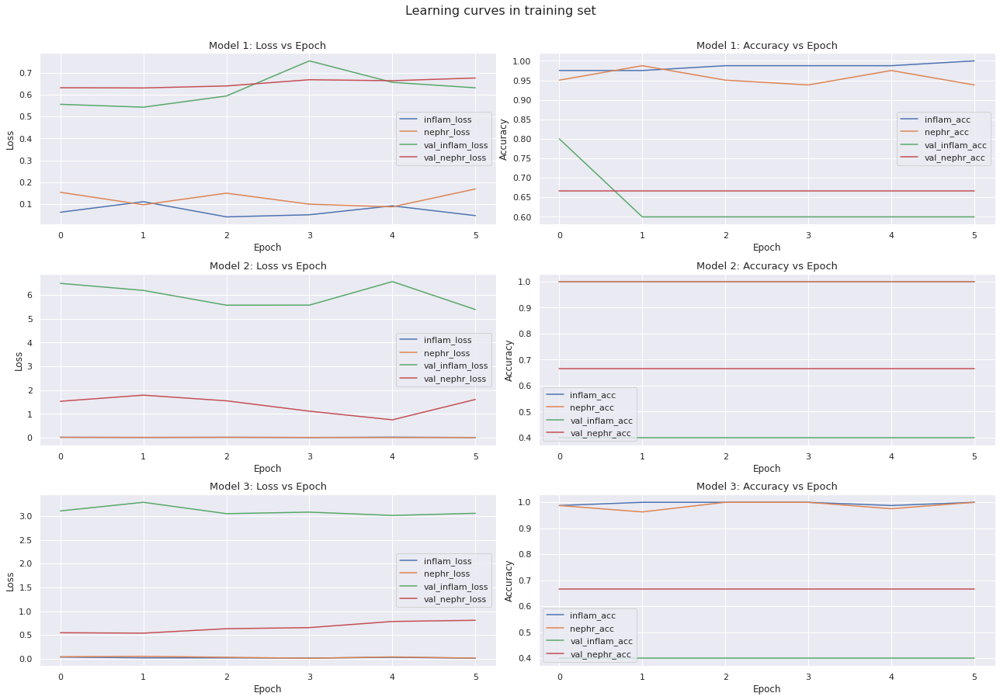

In [256]:
plot(df1, df2, df3, model1, model2, model3)

In [257]:
model1.evaluate(x_test, [inflam_test, nephr_test])

1/1 [==============================] - 0s 32ms/step - loss: 0.7770 - inflam_loss: 0.6055 - nephr_loss: 1.1769 - inflam_acc: 0.7500 - nephr_acc: 0.2917


[0.7769518494606018,
 0.605535089969635,
 1.176924228668213,
 0.75,
 0.2916666567325592]

In [258]:
model2.evaluate(x_test, [inflam_test, nephr_test])

1/1 [==============================] - 0s 23ms/step - loss: 3.8877 - inflam_loss: 4.2283 - nephr_loss: 3.0931 - inflam_acc: 0.5417 - nephr_acc: 0.2917


[3.887730836868286,
 4.228267192840576,
 3.0931475162506104,
 0.5416666865348816,
 0.2916666567325592]

In [259]:
model3.evaluate(x_test, [inflam_test, nephr_test])

1/1 [==============================] - 0s 21ms/step - loss: 2.1143 - inflam_loss: 2.3379 - nephr_loss: 1.5926 - inflam_acc: 0.5417 - nephr_acc: 0.2917


[2.1142947673797607,
 2.3378732204437256,
 1.5926116704940796,
 0.5416666865348816,
 0.2916666567325592]

### Dataset sintetico

In [47]:
x_train = np.linspace(-1, 1, 1000)
y_train1 = x_train[:250] + 0.6*np.random.randn(250)
y_train2 = x_train[250:500] + 0.8*np.random.randn(250)
y_train3 = x_train[500:750] + 0.7*np.random.randn(250)
y_train4 = x_train[750:] + 0.9*np.random.randn(250)
y_train = np.hstack([y_train1, y_train2, y_train3, y_train4])

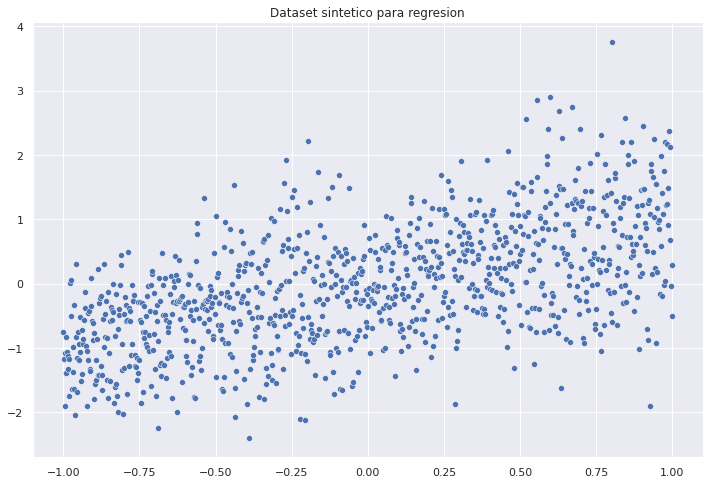

In [48]:
fig = plt.figure(figsize=(12, 8))

sns.scatterplot(x=x_train, y=y_train)
plt.title('Dataset sintetico para regresion')

plt.show()

In [49]:
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.2, random_state=0)

In [22]:
def get_model_1(units, dropout, activation):

  datos = Input(shape=(1, ), name = 'datos')
  h1 = Dense(units, activation=activation,
            kernel_regularizer='l1_l2')(datos)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  block_1_output = Dense(units, activation=activation, 
              kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(block_1_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)

  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = Dropout(dropout)(h1)
  outputs = Dense(1, activation='linear')(h1)
                 
  model = Model(inputs=datos, outputs = outputs)

  model.compile(optimizer='adam',
                loss='mse')

  return model

def get_model_2(units, dropout, activation):

  datos = Input(shape=(1, ), name = 'datos')
  h1 = Dense(units, activation=activation,
            kernel_regularizer='l1_l2')(datos)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  block_1_output = Dense(units, activation=activation, 
              kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(block_1_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_2_output = tf.keras.layers.add([h1, block_1_output])

  h1 = Dropout(dropout)(block_2_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_3_output = tf.keras.layers.add([h1, block_2_output])

  h1 = Dropout(dropout)(block_3_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_4_output = tf.keras.layers.add([h1, block_3_output])

  h1 = Dropout(dropout)(block_4_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_5_output = tf.keras.layers.add([h1, block_4_output])

  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(block_5_output)
  h1 = Dropout(dropout)(h1)
  outputs = Dense(1, activation='linear')(h1)
                 
  model = Model(inputs=datos, outputs = outputs)

  model.compile(optimizer='adam',
                loss='mse')

  return model

def get_model_3(units, dropout, activation):

  datos = Input(shape=(1, ), name = 'datos')
  h1 = Dense(units, activation=activation,
            kernel_regularizer='l1_l2')(datos)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  block_1_output = Dense(units, activation=activation, 
              kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(block_1_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_2_output = tf.keras.layers.add([h1, block_1_output])

  h1 = Dropout(dropout)(block_2_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)

  h1 = Dropout(dropout)(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)

  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = Dropout(dropout)(h1)
  outputs = Dense(1, activation='linear')(h1)
                 
  model = Model(inputs=datos, outputs = outputs)

  model.compile(optimizer='adam',
                loss='mse')

  return model


In [50]:
model1 = get_model_1(units=16, dropout=0.3, activation='relu')
model2 = get_model_2(units=16, dropout=0.3, activation='relu')
model3 = get_model_3(units=16, dropout=0.3, activation='relu')

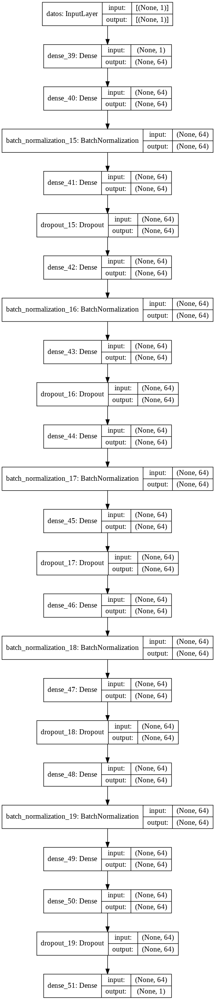

In [15]:
tf.keras.utils.plot_model(model1, to_file='model_1.png', show_shapes=True)

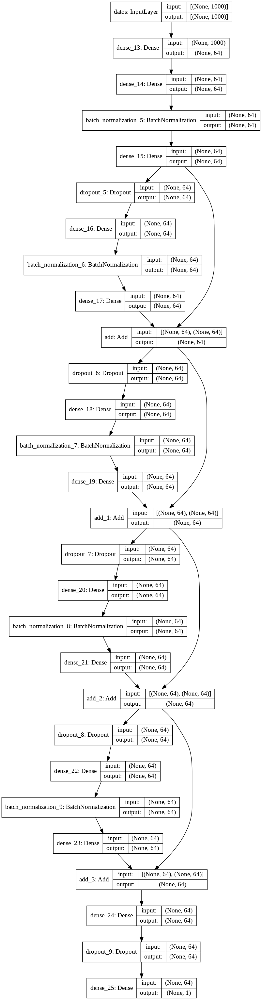

In [10]:
tf.keras.utils.plot_model(model2, to_file='model_2.png', show_shapes=True)

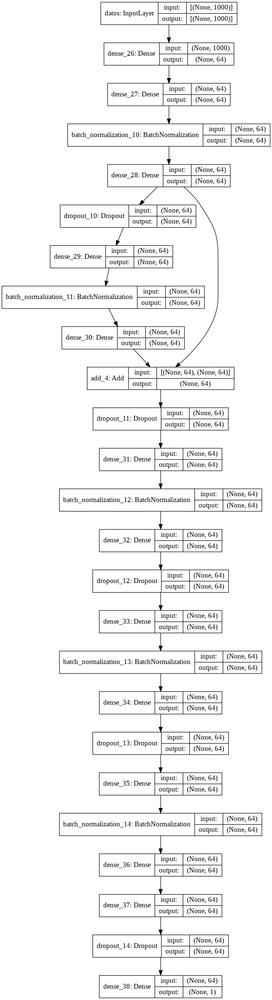

In [11]:
tf.keras.utils.plot_model(model3, to_file='model_3.png', show_shapes=True)

In [61]:
history_model1 = model1.fit(x_train, y_train, epochs=10, batch_size=256, validation_split=0.3, verbose=False)
history_model2 = model2.fit(x_train, y_train, epochs=10, batch_size=256, validation_split=0.3, verbose=False)
history_model3 = model3.fit(x_train, y_train, epochs=10, batch_size=256, validation_split=0.3, verbose=False)

In [62]:
df1 = pd.DataFrame(history_model1.history)
df2 = pd.DataFrame(history_model2.history)
df3 = pd.DataFrame(history_model3.history)

In [68]:
def plot(df1, df2, df3, model1, model2, model3):

  # create figure (fig), and array of axes (ax)
  fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 6))
  ax = ax.flatten()
  fig.suptitle('Learning curves in training set', fontsize=16, y=1.04)

  sns.lineplot(x=df1.index , y='loss', data=df1, ax=ax[0], label='loss')
  sns.lineplot(x=df1.index , y='val_loss', data=df1, ax=ax[0], label='val_loss')
  ax[0].set_title('Model 1: Loss vs Epoch', fontsize=13)
  ax[0].set_ylabel('Loss')
  ax[0].set_xlabel('Epoch')


  sns.lineplot(x=df2.index , y='loss', data=df2, ax=ax[1], label='loss')
  sns.lineplot(x=df2.index , y='val_loss', data=df2, ax=ax[1], label='val_loss')
  ax[1].set_title('Model 2: Loss vs Epoch', fontsize=13)
  ax[1].set_ylabel('Loss')
  ax[1].set_xlabel('Epoch')

  sns.lineplot(x=df2.index , y='loss', data=df3, ax=ax[2], label='loss')
  sns.lineplot(x=df2.index , y='val_loss', data=df3, ax=ax[2], label='val_loss')
  ax[2].set_title('Model 3: Loss vs Epoch', fontsize=13)
  ax[2].set_ylabel('Loss')
  ax[2].set_xlabel('Epoch')


  plt.tight_layout()
  plt.legend()
  plt.show()

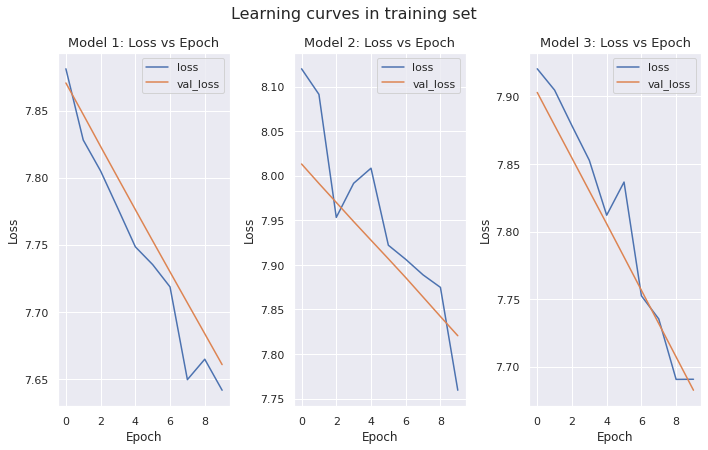

In [69]:
plot(df1, df2, df3, model1, model2, model3)

In [65]:
model1.evaluate(x_test, y_test)

7/7 [==============================] - 0s 2ms/step - loss: 7.5029


7.502883434295654

In [66]:
model2.evaluate(x_test, y_test)

7/7 [==============================] - 0s 3ms/step - loss: 7.7375


7.737525463104248

In [67]:
model3.evaluate(x_test, y_test)

7/7 [==============================] - 0s 3ms/step - loss: 7.5449


7.5449299812316895

## **Challenge Kaggle (40%)**

Esta parte de la tarea consiste en predecir el precio de una casa a partir de metadata como el número de habitaciones, el número de baños y el área total de la casa. Opcionalmente, los participantes podrán utilizar información visual de la propiedad (fotos) para mejorar sus predicciones. 



### Dataset

El dataset de entrenamiento incluirá la información de 443 propiedades con sus respectivos precios. El dataset de pruebas incluirá la información de 92 propiedades, pero no estarán disponibles los precios. La efectividad del modelo se determinará comparando las predicciones para el conjunto de pruebas con los valores reales vía MSE.

Mientras habilitamos la página en Kaggle, les dejamos el link a los datos para puedan comenzar a trabajar. Los primeros dos link corresponden a la metadata de las casas + el precio en el caso de los datos de entrenamiento:


> http://www.inf.utfsm.cl/~jnancu/metadata_casas_train.csv

> http://www.inf.utfsm.cl/~jnancu/metadata_casas_test.csv

La fotos de cada casa están disponibles en este link:

> http://www.inf.utfsm.cl/~jnancu/fotos-casas.zip 

Al descomprimir notarán que por cada propiedad se tienen 4 fotos (parte frontal, cocina, habitación principal y baño principal). Cada propiedad tiene un código (cod_casa en el archivo de metadata) que permite identificar las fotos.


Pueden también descargar los datos directamente a la máquina donde estén ejecutando el código con los siguientes comandos


También pueden subior los archivos a su Google Drive y conectarse con él:

### Librerias

In [ ]:
# Instalar el optimizer
! pip install adabelief-tf==0.2.0

In [ ]:
# Librerias
import pandas as pd
import numpy as np
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
from astropy.stats import bayesian_blocks
import tensorflow as tf
import os
import cv2
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, MaxPool2D, Conv2D, Flatten, GlobalAveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from adabelief_tf import AdaBeliefOptimizer

In [ ]:
# Tensorboard
from tensorboard.plugins.hparams import api as hp
import datetime

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Carga de datos

In [ ]:
print("Mounting your Google Drive ...")

from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

# Esta es la ruta en mi drive
path = '/content/drive/MyDrive/Intro a las redes neuronales/Tareas/Tarea 1/'

Mounting your Google Drive ...
Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
!unzip -o -q '/content/drive/MyDrive/Intro a las redes neuronales/Tareas/Tarea 1/fotos-casas.zip'

In [ ]:
data_train = pd.read_csv(path + 'metadata_casas_train.csv')
data_test = pd.read_csv(path + 'metadata_casas_test.csv')

# Union de ambos dataset
dataset = pd.concat([data_train, data_test])

print(f'Shape data_train = {data_train.shape}')
print(f'Shape data_test = {data_test.shape}')

Shape data_train = (443, 7)
Shape data_test = (92, 6)


In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 443 entries, 0 to 442
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    443 non-null    int64  
 1   cod_casa      443 non-null    object 
 2   habitaciones  443 non-null    int64  
 3   banos         443 non-null    float64
 4   area          443 non-null    int64  
 5   zipcode       443 non-null    int64  
 6   precio        443 non-null    int64  
dtypes: float64(1), int64(5), object(1)
memory usage: 24.4+ KB


In [ ]:
data_train.describe()

,Unnamed: 0,habitaciones,banos,area,zipcode,precio
count,443.000000,443.000000,443.000000,443.000000,443.000000,4.430000e+02
mean,268.099323,3.358916,2.660835,2346.255079,90786.645598,5.798091e+05
std,153.815174,1.182386,0.999268,1241.917375,7459.104896,5.298119e+05
min,0.000000,1.000000,1.000000,701.000000,36372.000000,2.200000e+04
25%,138.500000,2.000000,2.000000,1433.000000,92276.000000,2.270000e+05
50%,270.000000,3.000000,2.500000,2024.000000,92880.000000,5.200000e+05
75%,396.500000,4.000000,3.000000,3057.000000,93510.000000,7.001000e+05
max,533.000000,10.000000,7.000000,9583.000000,98021.000000,5.858000e+06


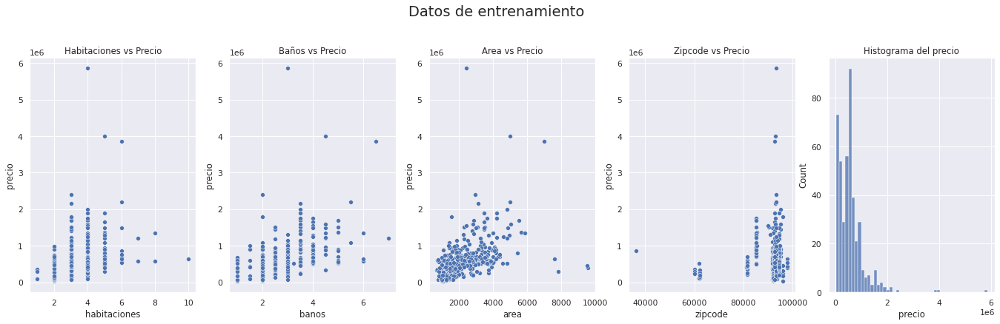

In [ ]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(24, 6), dpi=70)
fig.suptitle('Datos de entrenamiento', fontsize=20, y=1.05)

sns.scatterplot(x=data_train['habitaciones'], y=data_train['precio'], ax=ax1)
ax1.set_title('Habitaciones vs Precio')

sns.scatterplot(x=data_train['banos'], y=data_train['precio'], ax=ax2)
ax2.set_title('Baños vs Precio')

sns.scatterplot(x=data_train['area'], y=data_train['precio'], ax=ax3)
ax3.set_title('Area vs Precio')

sns.scatterplot(x=data_train['zipcode'], y=data_train['precio'], ax=ax4)
ax4.set_title('Zipcode vs Precio')

sns.histplot(x=data_train['precio'], ax=ax5)
ax5.set_title('Histograma del precio')

plt.show()

### Preprocesamiento de los datos

In [ ]:
bins_price = bayesian_blocks(data_train['precio'])
y_binned = np.digitize(data_train['precio'], bins_price[:11])

In [ ]:
# Split train dataset into data_train and data_val
val_size = 0.15  #@param {type:"slider", min:0.1, max:0.3, step:0.05}
data_train, data_val = train_test_split(data_train, test_size=val_size, stratify=y_binned, random_state=1)

print(f'Shape data_train = {data_train.shape}')
print(f'Shape data_val = {data_val.shape}')

Shape data_train = (376, 7)
Shape data_val = (67, 7)


In [ ]:
# Calculate silhouette 
silhouette = []
k = np.arange(2, 40)
data = np.array(data_train['area']).reshape(-1, 1)

for i in k:
  
  kmeans = KMeans(n_clusters=i, random_state=0).fit(data)

  # Silhouette score
  silhouette.append(silhouette_score(data, kmeans.labels_))

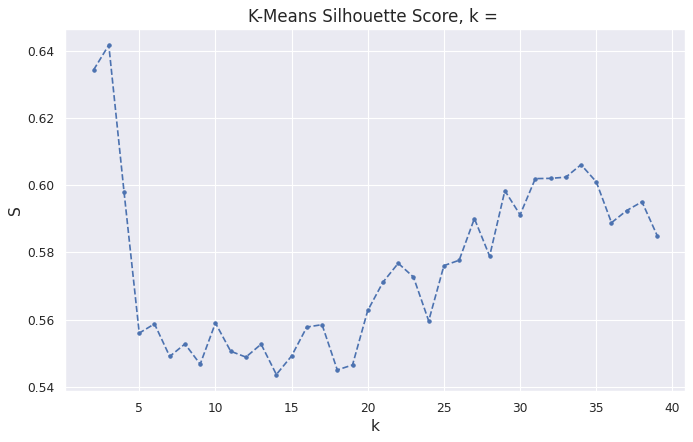

In [ ]:
# Plot silhouette

fig = plt.figure(figsize=(10, 6), dpi=80)

plt.plot(k, silhouette, 'b--.')
plt.title("K-Means Silhouette Score, k = ", size=15)
plt.ylabel('S', size=14)
plt.xlabel('k', size=14)

plt.show()

In [ ]:
best_silhouette = np.sort(silhouette[5:])[-20:]
best_silhouette

array([0.55959195, 0.56270563, 0.5711141 , 0.57264295, 0.57604853,
       0.57674615, 0.5776419 , 0.57888036, 0.58498116, 0.58881916,
       0.59005529, 0.59117612, 0.59245112, 0.59503814, 0.59834053,
       0.60100115, 0.60194566, 0.60201881, 0.60237515, 0.60608491])

In [ ]:
candidatos = []

for s in best_silhouette[::-1]:
  candidatos.append(k[np.where(silhouette == s)[0][0]])

print('Posibles valores de k, ordenados de mejor a peor')
print(np.array(candidatos))

Posibles valores de k, ordenados de mejor a peor
[34 33 32 31 35 29 38 37 30 27 36 39 28 26 22 25 23 21 20 24]


In [ ]:
def preprocess_data(data_train, data_val, data_test, modo, k):
  col_names = ['habitaciones', 'banos']

  if(modo == 'standar'):

    scaler = StandardScaler()

    scaler.fit(data_train[col_names].values)

    data_train.loc[:, col_names] = scaler.transform(data_train[col_names].values)
    data_val.loc[:, col_names] = scaler.transform(data_val[col_names].values)
    data_test.loc[:, col_names] = scaler.transform(data_test[col_names].values)

  if(modo == 'minmax'):
    
    scaler = MinMaxScaler()

    scaler.fit(data_train[col_names].values)

    data_train.loc[:, col_names] = scaler.transform(data_train[col_names].values)
    data_val.loc[:, col_names] = scaler.transform(data_val[col_names].values)
    data_test.loc[:, col_names] = scaler.transform(data_test[col_names].values)

    
  d_train = np.array(data_train['area']).reshape(-1, 1)
  kmeans = KMeans(n_clusters=k, random_state=0).fit(d_train)
  clusters = kmeans.cluster_centers_

  bins_area = np.sort(clusters.reshape(-1)).astype(int)
  group_names = ['area_' + str(i) for i in range(k-1)]

  data_train['areabinned'] = pd.cut(data_train['area'], bins_area, labels=group_names, include_lowest=True).cat.add_categories('out')
  data_val['areabinned'] = pd.cut(data_val['area'], bins_area, labels=group_names, include_lowest=True).cat.add_categories('out')
  data_test['areabinned'] = pd.cut(data_test['area'], bins_area, labels=group_names, include_lowest=True).cat.add_categories('out')
  
  data_train.fillna('out', inplace=True)
  data_val.fillna('out', inplace=True)
  data_test.fillna('out', inplace=True)

  onehot1 = OneHotEncoder(sparse=False).fit(np.array(data_train['areabinned']).reshape(-1, 1))

  area_binned_train = onehot1.transform(np.array(data_train['areabinned']).reshape(-1, 1))
  area_binned_val = onehot1.transform(np.array(data_val['areabinned']).reshape(-1, 1))
  area_binned_test = onehot1.transform(np.array(data_test['areabinned']).reshape(-1, 1))
  

  bins_zipcode = bayesian_blocks(data_train['zipcode'])
  group_names = ['zipcode_' + str(i) for i in range(len(bins_zipcode)-1)]

  data_train['zipbinned'] = pd.cut(data_train['zipcode'], bins_zipcode, labels=group_names, include_lowest=True).cat.add_categories('out')
  data_val['zipbinned'] = pd.cut(data_val['zipcode'], bins_zipcode, labels=group_names, include_lowest=True).cat.add_categories('out')
  data_test['zipbinned'] = pd.cut(data_test['zipcode'], bins_zipcode, labels=group_names, include_lowest=True).cat.add_categories('out')

  data_train.fillna('out', inplace=True)
  data_val.fillna('out', inplace=True)
  data_test.fillna('out', inplace=True)

  onehot2 = OneHotEncoder(sparse=False).fit(np.array(data_train['zipbinned']).reshape(-1, 1))

  zip_binned_train = onehot2.transform(np.array(data_train['zipbinned']).reshape(-1, 1))
  zip_binned_val = onehot2.transform(np.array(data_val['zipbinned']).reshape(-1, 1))
  zip_binned_test = onehot2.transform(np.array(data_test['zipbinned']).reshape(-1, 1))


  data_train = pd.DataFrame(np.hstack([data_train, area_binned_train, zip_binned_train]))
  data_val = pd.DataFrame(np.hstack([data_val, area_binned_val, zip_binned_val]))
  data_test = pd.DataFrame(np.hstack([data_test, area_binned_test, zip_binned_test]))

  # Rename columns in dataframes
  columns_train_val = ['id', 'cod_casa', 'habitaciones', 'banos', 'area', 'zipcode', 'precio', 'areabinned', 'zipbinned'] + ['area_' + str(i) for i in range(k-1)] + ['zip_' + str(i) for i in range(len(bins_zipcode)-1)] + ['out']

  columns_test = ['id', 'cod_casa', 'habitaciones', 'banos', 'area', 'zipcode', 'areabinned', 'zipbinned'] + ['area_' + str(i) for i in range(k-1)] + ['zip_' + str(i) for i in range(len(bins_zipcode)-1)] + ['out']
                  

  columns_train_val = {k: v for k, v in enumerate(columns_train_val)}
  columns_test = {k: v for k, v in enumerate(columns_test)}

  data_train.rename(columns=columns_train_val, inplace=True)
  data_val.rename(columns=columns_train_val, inplace=True)
  data_test.rename(columns=columns_test, inplace=True)

  return data_train, data_val, data_test

In [ ]:
k = 5
tipo = 'minmax'
data_train, data_val, data_test = preprocess_data(data_train, data_val, data_test, tipo, k)

In [ ]:
data_train.head()

,id,cod_casa,habitaciones,banos,area,zipcode,precio,areabinned,zipbinned,area_0,area_1,area_2,area_3,area_4,area_5,area_6,area_7,area_8,area_9,area_10,area_11,area_12,area_13,area_14,area_15,area_16,area_17,area_18,area_19,area_20,area_21,area_22,area_23,area_24,area_25,zip_0,zip_1,zip_2,zip_3,zip_4,zip_5,zip_6,zip_7,zip_8,zip_9,zip_10,zip_11,zip_12,zip_13,zip_14,zip_15,zip_16,zip_17,zip_18,out
0,403,Q4KZNQSKYNYQ9RX,0.142857,0.181818,1344,92276,89500,area_2,zipcode_10,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,323,3G6O22TDBHO7QL6,0.714286,0.545455,3705,93510,765000,area_17,zipcode_14,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,46,Y29VMC8JOS4X91G,0.428571,0.363636,2504,81524,500000,area_10,zipcode_4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,7,56YWYJVQXN6CQCH,0.428571,0.727273,5524,85266,1698000,area_22,zipcode_6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,467,0AQIWZ2XDKI0WRF,0.428571,0.272727,2699,93446,629000,area_11,zipcode_14,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
data_val.head()

,id,cod_casa,habitaciones,banos,area,zipcode,precio,areabinned,zipbinned,area_0,area_1,area_2,area_3,area_4,area_5,area_6,area_7,area_8,area_9,area_10,area_11,area_12,area_13,area_14,area_15,area_16,area_17,area_18,area_19,area_20,area_21,area_22,area_23,area_24,area_25,area_26,area_27,area_28,area_29,area_30,area_31,area_32,zip_0,zip_1,zip_2,zip_3,zip_4,zip_5,zip_6,zip_7,zip_8,zip_9,zip_10,zip_11,zip_12,zip_13,zip_14,zip_15,zip_16,zip_17,zip_18,out
0,129,K5NNG4C35L5VL4U,0.285714,0.363636,1825,92677,685000,area_9,zipcode_12,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,342,ZH20G8K3UKA0077,0.285714,0.181818,1248,92276,139500,area_4,zipcode_10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,491,NPG9KSN2BTSWM1P,0.142857,0,854,93446,179000,area_0,zipcode_14,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,293,62KXBD60HUFQCNP,0.285714,0.181818,1368,92276,193000,area_5,zipcode_10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,184,GPMXJ2GBTJKX7BF,0.571429,0.454545,2879,94501,1327685,area_16,zipcode_16,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [ ]:
data_test.head()

,id,cod_casa,habitaciones,banos,area,zipcode,areabinned,zipbinned,area_0,area_1,area_2,area_3,area_4,area_5,area_6,area_7,area_8,area_9,area_10,area_11,area_12,area_13,area_14,area_15,area_16,area_17,area_18,area_19,area_20,area_21,area_22,area_23,area_24,area_25,area_26,area_27,area_28,area_29,area_30,area_31,area_32,zip_0,zip_1,zip_2,zip_3,zip_4,zip_5,zip_6,zip_7,zip_8,zip_9,zip_10,zip_11,zip_12,zip_13,zip_14,zip_15,zip_16,zip_17,zip_18,out
0,5,0R9Z8TJ4HVOWUAJ,0.428571,0.727273,4581,85266,area_27,zipcode_6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,18,3NYK5GU80YVQR1A,0.571429,0.545455,4190,85255,area_24,zipcode_4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,21,92S3N8VWFYQRI0Q,0.714286,1,5963,85262,area_30,zipcode_5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,28,YZUR2KSKR0B46WU,0.428571,0.545455,4464,85377,area_26,zipcode_7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,35,HXFZX9UOWGJ7PTE,0.285714,0.636364,3893,85255,area_23,zipcode_4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [ ]:
# Cargar y separar las imagenes
def process_image_dataset(img_folder, width, height, df):

  parte_frontal = np.zeros((df.shape[0], width, height))
  cocina = np.zeros((df.shape[0], width, height))
  habitacion_principal = np.zeros((df.shape[0], width, height))
  bano_principal = np.zeros((df.shape[0], width, height))
   
  for filename in os.listdir(img_folder):
        
      image_path = os.path.join(img_folder, filename)
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

      # hacemos un resize del tamaño de las imágenes antes de ingresarlo a nuestro modelo
      image = cv2.resize(image, (width, height)) # por ejemplo, 228 x 228 x 1 
      image = np.array(image)
      image = image.astype('float32')
      image /= 255 # escalar a [0, 1] 

      codigo, nombre_imagen = filename.split('_')
        
      index = df.loc[df['cod_casa'] == codigo].values[0][0]

      if(nombre_imagen == 'bathroom.jpg'):
        bano_principal[index] = image

      if(nombre_imagen == 'bedroom.jpg'):
        habitacion_principal[index] = image

      if(nombre_imagen == 'frontal.jpg'):
        parte_frontal[index] = image
        
      if(nombre_imagen == 'kitchen.jpg'):
        cocina[index] = image
 
  return parte_frontal, cocina, habitacion_principal, bano_principal

In [ ]:
# Separar las fotos
frontal, cocina, principal, bano = process_image_dataset('fotos-casas', 224, 224, dataset)

In [ ]:
frontal = np.expand_dims(frontal, -1)
cocina = np.expand_dims(cocina, -1)
principal = np.expand_dims(principal, -1)
bano = np.expand_dims(bano, -1)

print(f'Shape frontal = {frontal[0].shape}')
print(f'Shape cocina = {cocina[0].shape}')
print(f'Shape principal = {principal[0].shape}')
print(f'Shape bano = {bano[0].shape}')

Shape frontal = (224, 224, 1)
Shape cocina = (224, 224, 1)
Shape principal = (224, 224, 1)
Shape bano = (224, 224, 1)


In [ ]:
def get_train_test(dataset, df_train, df_val, df_test, k):

  # Id de cada dato en el dataset [0, ..., 534]
  id = np.arange(0, dataset.shape[0])
  
  # Crear un dataset con todos los datos
  dataset = tf.data.Dataset.from_tensor_slices((id, frontal, cocina, principal, bano))

  train_id = list(df_train['id']) # ids asociados al dataset de entrenamiento
  val_id = list(df_val['id']) # ids asociados al dataset de validacion
  test_id = list(df_test['id']) # ids asociados al dataset de test

  #numeric_columns = ['habitaciones', 'banos'] + ['area_' + str(i) for i in range(5)] + ['zip_' + str(i) for i in range(21)]

  numeric_columns = ['habitaciones', 'banos'] + ['area_' + str(i) for i in range(k-1)] + ['zip_' + str(i) for i in range(19)]
  
  # obtener los datos de entrenamiento y el target respectivo
  datos_train = df_train.loc[:, numeric_columns].values
  target_train = df_train.loc[:, 'precio'].values

  datos_val = df_val.loc[:, numeric_columns].values
  target_val = df_val.loc[:, 'precio'].values

  # obtener los datos de test
  datos_test = df_test.loc[:, numeric_columns].values
  

  # pasar los datos anteriores a un dataset
  datos_train_dataset = tf.data.Dataset.from_tensor_slices((np.asarray(datos_train).astype('float32'), np.asarray(target_train).astype('float32')))
  datos_val_dataset = tf.data.Dataset.from_tensor_slices((np.asarray(datos_val).astype('float32'), np.asarray(target_val).astype('float32')))
  datos_test_dataset = tf.data.Dataset.from_tensor_slices(np.asarray(datos_test).astype('float32'))


  # Separar los dataset en train y test, en base a su id
  train_dataset = dataset.filter(lambda id, frontal, cocina, principal, bano, ids=train_id: tf.reduce_any(tf.equal(id, ids)))
  val_dataset = dataset.filter(lambda id, frontal, cocina, principal, bano, ids=val_id: tf.reduce_any(tf.equal(id, ids)))
  test_dataset = dataset.filter(lambda id, frontal, cocina, principal, bano, ids=test_id: tf.reduce_any(tf.equal(id, ids)))

  # Juntar los dataset
  train_dataset = tf.data.Dataset.zip((datos_train_dataset, train_dataset))
  val_dataset = tf.data.Dataset.zip((datos_val_dataset, val_dataset))
  test_dataset = tf.data.Dataset.zip((datos_test_dataset, test_dataset))

  # Quitar el id del dataset de entrenaminto y crear un tupla de tipo input, output
  # para el dataset
  def aux1(datos, imagenes):
    return (datos[0], imagenes[1], imagenes[2], imagenes[3], imagenes[4]), datos[1]

  # Quitar el id del dataset de test y dejarlo todo junto en una tupla de tipo input
  def aux2(datos, imagenes):
    return (datos, imagenes[1], imagenes[2], imagenes[3], imagenes[4])

  train_dataset = train_dataset.map(aux1)
  val_dataset = val_dataset.map(aux1)
  test_dataset = test_dataset.map(aux2)

  return train_dataset, val_dataset, test_dataset

In [ ]:
# Obtain train_dataset and test_dataset
train_dataset, val_dataset, test_dataset = get_train_test(dataset, data_train, data_val, data_test, k)

In [ ]:
train_size = 0
for _ in train_dataset:
  train_size += 1

val_size = 0
for _ in val_dataset:
  val_size += 1

test_size = 0
for _ in test_dataset:
  test_size += 1

print("Train size: ", train_size)
print("Val size: ", val_size)
print("Test size: ", test_size)

Train size:  376
Val size:  67
Test size:  92


In [ ]:
train_dataset

<MapDataset shapes: (((25,), (224, 224, 1), (224, 224, 1), (224, 224, 1), (224, 224, 1)), ()), types: ((tf.float32, tf.float64, tf.float64, tf.float64, tf.float64), tf.float32)>

### TensorBoard: Hyperparameter Optimization

In [ ]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([64, 128, 256, 512]))
HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.1, 0.2, 0.3, 0.4, 0.5, 0.6]))
HP_ACTIVATION = hp.HParam('activation', hp.Discrete(['relu', 'elu']))
HP_DELTA = hp.HParam('delta', hp.Discrete([0.6, 0.7, 0.8, 0.9]))

METRIC_MSE = 'val_mse'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_ACTIVATION, HP_DELTA],
    metrics=[hp.Metric(METRIC_MSE, display_name='Val MSE')],
  )

In [ ]:
# Modelo
def train_test_model(hparams):
 
  datos = Input(shape=(49, ), name = 'datos')
  frontal = Input(shape=(224, 224, 1), name = 'Imagen frontal')
  cocina = Input(shape=(224, 224, 1), name = 'Cocina')
  principal = Input(shape=(224, 224, 1), name = 'Habitación principal')
  bano = Input(shape=(224, 224, 1), name = 'Baño principal')


  ############# Red asociada a los datos en el dataframe #######################
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION],
            kernel_regularizer='l1_l2')(datos)
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  block_1_output = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
              kernel_regularizer='l1_l2')(h1)

  
  h1 = Dropout(hparams[HP_DROPOUT])(block_1_output)
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(h1)
  block_2_output = tf.keras.layers.add([h1, block_1_output])


  h1 = Dropout(hparams[HP_DROPOUT])(block_2_output)
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(h1)
  block_3_output = tf.keras.layers.add([h1, block_2_output])


  h1 = Dropout(hparams[HP_DROPOUT])(block_3_output)
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(h1)
  block_4_output = tf.keras.layers.add([h1, block_3_output])


  h1 = Dense(hparams[HP_NUM_UNITS], activation=hparams[HP_ACTIVATION], 
             kernel_regularizer='l1_l2')(block_4_output)
  h1 = Dropout(hparams[HP_DROPOUT])(h1)
  outputs = Dense(1, activation='linear')(h1)

  model = Model(inputs=[datos, frontal, cocina, principal, bano], outputs = outputs)

  # Compilar el modelo
  model.compile(loss=tf.keras.losses.Huber(delta=hparams[HP_DELTA]),
                optimizer=AdaBeliefOptimizer(learning_rate=1e-3, epsilon=1e-14, rectify=False, print_change_log = False),
                metrics=['mse'])

  model.fit(train_dataset, epochs=15, 
            callbacks=[tf.keras.callbacks.TensorBoard(log_folder),
            hp.KerasCallback(log_folder, hparams)])
  
  _, mse = model.evaluate(val_dataset)

  return mse

In [ ]:
log_folder = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    mse = train_test_model(hparams)
    tf.summary.scalar(METRIC_MSE, mse, step=1)

In [ ]:
session_num = 0

for num_units in HP_NUM_UNITS.domain.values:
  for dropout_rate in HP_DROPOUT.domain.values:
    for activation in HP_ACTIVATION.domain.values:
      for delta in HP_DELTA.domain.values:
        hparams = {
            HP_NUM_UNITS: num_units,
            HP_DROPOUT: dropout_rate,
            HP_ACTIVATION: activation,
            HP_DELTA: delta,
        }
        run_name = "run-%d" % session_num
        print('--- Starting trial: %s' % run_name)
        print({h.name: hparams[h] for h in hparams})
        run('logs/hparam_tuning/' + run_name, hparams)
        session_num += 1

--- Starting trial: run-0
{'num_units': 64, 'dropout': 0.1, 'activation': 'elu', 'delta': 0.6}


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Se han truncado las últimas 5000 líneas del flujo de salida.
Epoch 8/15
22/22 [==============================] - 1s 12ms/step - loss: 277077.6562 - mse: 372982022144.0000
Epoch 9/15
22/22 [==============================] - 1s 12ms/step - loss: 216178.2500 - mse: 274354814976.0000
Epoch 10/15
22/22 [==============================] - 1s 12ms/step - loss: 160994.1250 - mse: 194545139712.0000
Epoch 11/15
22/22 [==============================] - 1s 12ms/step - loss: 147393.2969 - mse: 162750431232.0000
Epoch 12/15
22/22 [==============================] - 1s 12ms/step - loss: 139969.9219 - mse: 147496222720.0000
Epoch 13/15
22/22 [==============================] - 1s 11ms/step - loss: 129111.6172 - mse: 134139904000.0000
Epoch 14/15
22/22 [==============================] - 1s 11ms/step - loss: 130965.8047 - mse: 127310553088.0000
Epoch 15/15
6/6 [==============================] - 1s 6ms/step - loss: 89232.6016 - mse: 53535805440.0000
--- Starting trial: run-41
{'num_units': 64, 'dropout': 0.

In [ ]:
%tensorboard --logdir logs/hparam_tuning

<IPython.core.display.Javascript object>

In [ ]:
# Guardar los resultados en el drive
# ! cp -r '/content/logs' '/content/drive/MyDrive/Intro a las redes neuronales/Tareas/Tarea 1'

In [ ]:
# Eliminar la carpeta logs
! rm -rf ./logs/

### Modelo sin las imagenes

In [ ]:
# Modelo
def get_model_mlp(units, dropout, activation, delta):
 
  datos = Input(shape=(25, ), name = 'datos')
  frontal = Input(shape=(224, 224, 1), name = 'Imagen frontal')
  cocina = Input(shape=(224, 224, 1), name = 'Cocina')
  principal = Input(shape=(224, 224, 1), name = 'Habitación principal')
  bano = Input(shape=(224, 224, 1), name = 'Baño principal')


  ############# Red asociada a los datos en el dataframe #######################
  h1 = Dense(units, activation=activation,
            kernel_regularizer='l1_l2')(datos)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  block_1_output = Dense(units, activation=activation, 
              kernel_regularizer='l1_l2')(h1)

  
  h1 = Dropout(dropout)(block_1_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_2_output = tf.keras.layers.add([h1, block_1_output])


  h1 = Dropout(dropout)(block_2_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_3_output = tf.keras.layers.add([h1, block_2_output])


  h1 = Dropout(dropout)(block_3_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_4_output = tf.keras.layers.add([h1, block_3_output])


  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(block_4_output)
  h1 = Dropout(dropout)(h1)
  outputs = Dense(1, activation='linear')(h1)

  model = Model(inputs=[datos, frontal, cocina, principal, bano], outputs = outputs)

  # Compilar el modelo
  model.compile(loss=tf.keras.losses.Huber(delta=delta),
                optimizer=AdaBeliefOptimizer(learning_rate=1e-3, epsilon=1e-14, rectify=False, print_change_log = False),
                metrics=['mse'])

  return model

In [ ]:
model = get_model_mlp(units=512, dropout=0.5, activation='elu', delta=0.8)

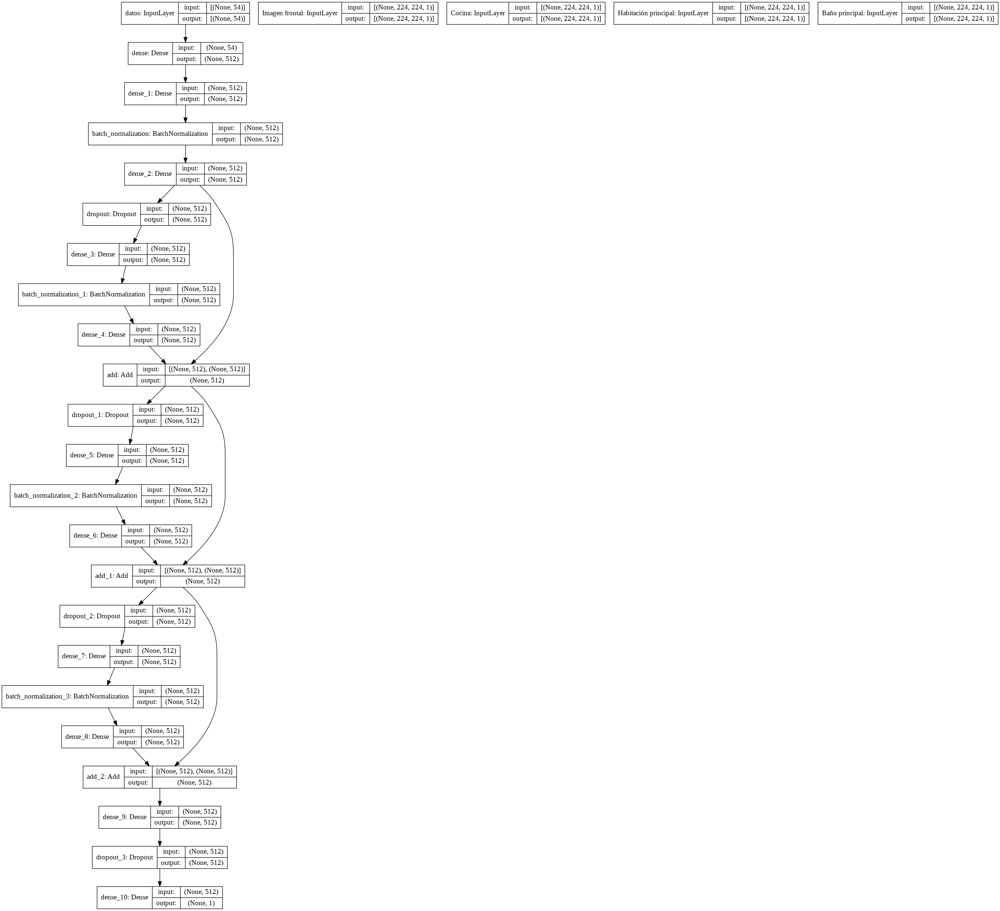

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model, 'model.png', show_shapes=True)

In [ ]:
# Callbacks for the model

#checkpoint
checkpoint_path = 'checkpoint_model/checkpoints'
checkpoint = ModelCheckpoint(filepath=checkpoint_path, monitor='val_mse', save_best_only=True, save_weights_only=True)

# early stopping
early_stopping = EarlyStopping(monitor='val_mse', patience=10)

In [ ]:
# Preparar los datasets
AUTOTUNE = tf.data.AUTOTUNE
batch_size = 16 #@param {type:"slider", min:2, max:256, step:2}

# For perfect shuffling, a buffer size greater than or equal to the full size of the dataset is required.
train_dataset = train_dataset.batch(batch_size).shuffle(400).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.batch(batch_size).shuffle(100).prefetch(buffer_size=AUTOTUNE)

In [ ]:
history = model.fit(train_dataset, epochs=100, validation_data=val_dataset, callbacks=[checkpoint, early_stopping])

Epoch 1/100
24/24 [==============================] - 7s 62ms/step - loss: 465294.1250 - mse: 613529485312.0000 - val_loss: 433833.5625 - val_mse: 594792873984.0000
Epoch 2/100
24/24 [==============================] - 1s 47ms/step - loss: 438038.7188 - mse: 579258155008.0000 - val_loss: 279180.1562 - val_mse: 314435436544.0000
Epoch 3/100
24/24 [==============================] - 1s 46ms/step - loss: 289143.9688 - mse: 357048745984.0000 - val_loss: 388086.7812 - val_mse: 423616184320.0000
Epoch 4/100
24/24 [==============================] - 1s 46ms/step - loss: 213105.3438 - mse: 232274444288.0000 - val_loss: 211146.7969 - val_mse: 238441775104.0000
Epoch 5/100
24/24 [==============================] - 1s 49ms/step - loss: 191018.2969 - mse: 208485695488.0000 - val_loss: 199171.6094 - val_mse: 214163062784.0000
Epoch 6/100
24/24 [==============================] - 1s 47ms/step - loss: 179215.4688 - mse: 198649020416.0000 - val_loss: 202643.1406 - val_mse: 216873713664.0000
Epoch 7/100
24/2

In [ ]:
df = pd.DataFrame(history.history)
df.head()

,loss,mse,val_loss,val_mse
0,465294.125000,6.135295e+11,433833.562500,5.947929e+11
1,438038.718750,5.792582e+11,279180.156250,3.144354e+11
2,289143.968750,3.570487e+11,388086.781250,4.236162e+11
3,213105.343750,2.322744e+11,211146.796875,2.384418e+11
4,191018.296875,2.084857e+11,199171.609375,2.141631e+11


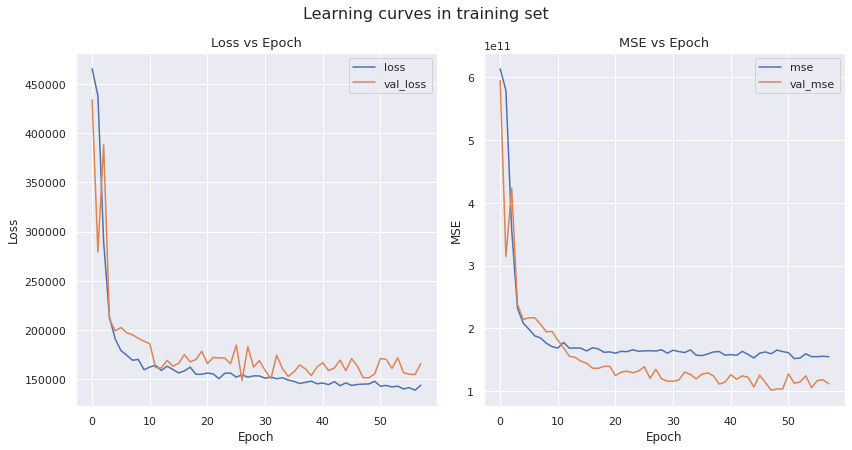

In [ ]:
# create figure (fig), and array of axes (ax)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Learning curves in training set', fontsize=16, y=1.04)

sns.lineplot(x=df.index , y='loss', data=df, ax=ax[0], label='loss')
sns.lineplot(x=df.index, y='val_loss', data=df, ax=ax[0], label='val_loss')
ax[0].set_title('Loss vs Epoch', fontsize=13)
ax[0].set_ylabel('Loss')
ax[0].set_xlabel('Epoch')

sns.lineplot(x=df.index , y='mse', data=df, ax=ax[1], label='mse')
sns.lineplot(x=df.index, y='val_mse', data=df, ax=ax[1], label='val_mse')
ax[1].set_title('MSE vs Epoch', fontsize=13)
ax[1].set_ylabel('MSE')
ax[1].set_xlabel('Epoch')

plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
# Load the best weights
model.load_weights(checkpoint_path)

#### Prediccion

In [ ]:
precios = []
test_dataset = test_dataset.batch(1)
for element in test_dataset.as_numpy_iterator():
  precios.append(model.predict(element)[0][0])

In [ ]:
print('minimo = ', np.min(precios))
print('maximo = ', np.max(precios))

minimo =  110202.81
maximo =  2248093.2


In [ ]:
data_predic = data_test.copy()
data_predic['precio'] = precios
data_predic['precio'] = data_predic['precio'].astype('int')
data_predic['id'] = data_predic['id'].astype('string')
data_predic.to_excel('predicciones.xls', columns=['id', 'precio'], index=False)

In [ ]:
# Borrar los pesos
!rm -rf checkpoint_model 

### Modelo con las imagenes

In [ ]:
# Cargar 4 modelos de tipo ResNet152V2
base_model1 = tf.keras.applications.ResNet152V2(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')
base_model1.trainable = False
base_model1._name = 'ResNet152V2_1'

base_model2 = tf.keras.applications.ResNet152V2(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')
base_model2.trainable = False
base_model2._name = 'ResNet152V2_2'

base_model3 = tf.keras.applications.ResNet152V2(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')
base_model3.trainable = False
base_model3._name = 'ResNet152V2_3'

base_model4 = tf.keras.applications.ResNet152V2(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')
base_model4.trainable = False
base_model4._name = 'ResNet152V2_4'

234553344/234545216 [==============================] - 2s 0us/step


In [ ]:
# Modelo
def get_model_cnn(base_model1, base_model2, base_model3, base_model4, units, dropout, activation, delta):
 
  datos = Input(shape=(42, ), name = 'datos')
  frontal = Input(shape=(224, 224, 1), name = 'Imagen frontal')
  cocina = Input(shape=(224, 224, 1), name = 'Cocina')
  principal = Input(shape=(224, 224, 1), name = 'Habitación principal')
  bano = Input(shape=(224, 224, 1), name = 'Baño principal')

  ############# Red asociada a los datos en el dataframe #######################
  h1 = Dense(units, activation=activation,
            kernel_regularizer='l1_l2')(datos)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  block_1_output = Dense(units, activation=activation, 
              kernel_regularizer='l1_l2')(h1)

  
  h1 = Dropout(dropout)(block_1_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_2_output = tf.keras.layers.add([h1, block_1_output])


  h1 = Dropout(dropout)(block_2_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_3_output = tf.keras.layers.add([h1, block_2_output])


  h1 = Dropout(dropout)(block_3_output)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  h1 = BatchNormalization()(h1)
  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(h1)
  block_4_output = tf.keras.layers.add([h1, block_3_output])


  h1 = Dense(units, activation=activation, 
             kernel_regularizer='l1_l2')(block_4_output)
 ###############################################################################


  preprocess_frontal = Conv2D(3, (3, 3), padding='SAME')(frontal)
  petrained_frontal = base_model1(preprocess_frontal, training=False)
  h2 = GlobalAveragePooling2D()(petrained_frontal)
  h2 = Dense(units, activation=activation,
             kernel_regularizer=tf.keras.regularizers.L2())(h2)


  preprocess_cocina = Conv2D(3, (3, 3), padding='SAME')(cocina)
  petrained_cocina = base_model2(preprocess_cocina, training=False)
  h3 = GlobalAveragePooling2D()(petrained_cocina)
  h3 = Dense(units, activation=activation,
             kernel_regularizer=tf.keras.regularizers.L2())(h3)


  preprocess_principal = Conv2D(3, (3, 3), padding='SAME')(principal)
  petrained_principal = base_model3(preprocess_principal, training=False)
  h4 = GlobalAveragePooling2D()(petrained_principal)
  h4 = Dense(units, activation=activation,
             kernel_regularizer=tf.keras.regularizers.L2(0.00001))(h4)


  preprocess_bano = Conv2D(3, (3, 3), padding='SAME')(bano)
  petrained_bano = base_model4(preprocess_bano, training=False)
  h5 = GlobalAveragePooling2D()(petrained_bano)
  h5 = Dense(units, activation=activation,
             kernel_regularizer=tf.keras.regularizers.L2(0.00001))(h5)


  images_block = tf.keras.layers.add([h2, h3, h4, h5])
  concat = tf.keras.layers.concatenate([h1, images_block])

  h = Dense(units, activation=activation,
             kernel_regularizer=tf.keras.regularizers.L2(0.00001))(concat)

  h = Dropout(dropout)(h)

  outputs = Dense(1, activation='linear')(h)

  model = Model(inputs=[datos, frontal, cocina, principal, bano], outputs = outputs)

  # Compilar el modelo
  model.compile(loss=tf.keras.losses.Huber(delta=delta),
                #https://github.com/juntang-zhuang/Adabelief-Optimizer
                optimizer=AdaBeliefOptimizer(learning_rate=1e-3, epsilon=1e-14, rectify=False, print_change_log = False),
                metrics=['mse'])

  return model

In [ ]:
model = get_model_cnn(base_model1, base_model2, base_model3, base_model4, units=512, dropout=0.5, activation='elu', delta=0.8)

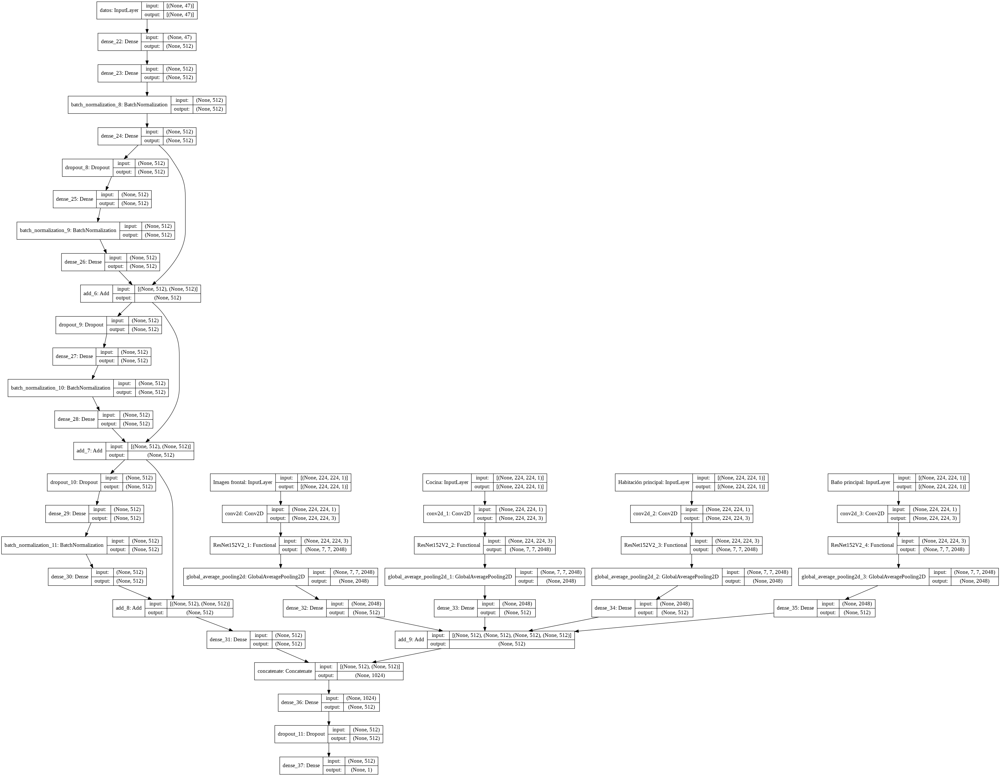

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model, 'model.png', show_shapes=True)

In [ ]:
# Callbacks for the model

#checkpoint
checkpoint_path = 'checkpoint_model/checkpoints'
checkpoint = ModelCheckpoint(filepath=checkpoint_path, monitor='val_loss', save_best_only=True, save_weights_only=True)

# early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10)

In [ ]:
# Preparar los datasets
AUTOTUNE = tf.data.AUTOTUNE
batch_size = 16 #@param {type:"slider", min:2, max:256, step:2}

# For perfect shuffling, a buffer size greater than or equal to the full size of the dataset is required.
train_dataset = train_dataset.batch(batch_size).shuffle(400).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.batch(batch_size).shuffle(100).prefetch(buffer_size=AUTOTUNE)

In [ ]:
history = model.fit(train_dataset, epochs=100, validation_data=val_dataset, callbacks=[checkpoint, early_stopping])

Epoch 1/100
24/24 [==============================] - 117s 2s/step - loss: 459824.0938 - mse: 606990368768.0000 - val_loss: 352079.0312 - val_mse: 471748083712.0000
Epoch 2/100
24/24 [==============================] - 29s 1s/step - loss: 296636.7812 - mse: 372025753600.0000 - val_loss: 336411.9688 - val_mse: 333486981120.0000
Epoch 3/100
24/24 [==============================] - 29s 1s/step - loss: 204733.6562 - mse: 236946489344.0000 - val_loss: 160899.8594 - val_mse: 171203411968.0000
Epoch 4/100
24/24 [==============================] - 30s 1s/step - loss: 176856.1094 - mse: 192045236224.0000 - val_loss: 167117.7969 - val_mse: 170424418304.0000
Epoch 5/100
24/24 [==============================] - 30s 1s/step - loss: 168661.3594 - mse: 181178351616.0000 - val_loss: 167608.8281 - val_mse: 176175546368.0000
Epoch 6/100
24/24 [==============================] - 30s 1s/step - loss: 158430.3906 - mse: 179000016896.0000 - val_loss: 182745.5781 - val_mse: 204375687168.0000
Epoch 7/100
24/24 [==

In [ ]:
df = pd.DataFrame(history.history)
df.head()

,loss,mse,val_loss,val_mse
0,459824.093750,6.069904e+11,352079.031250,4.717481e+11
1,296636.781250,3.720258e+11,336411.968750,3.334870e+11
2,204733.656250,2.369465e+11,160899.859375,1.712034e+11
3,176856.109375,1.920452e+11,167117.796875,1.704244e+11
4,168661.359375,1.811784e+11,167608.828125,1.761755e+11


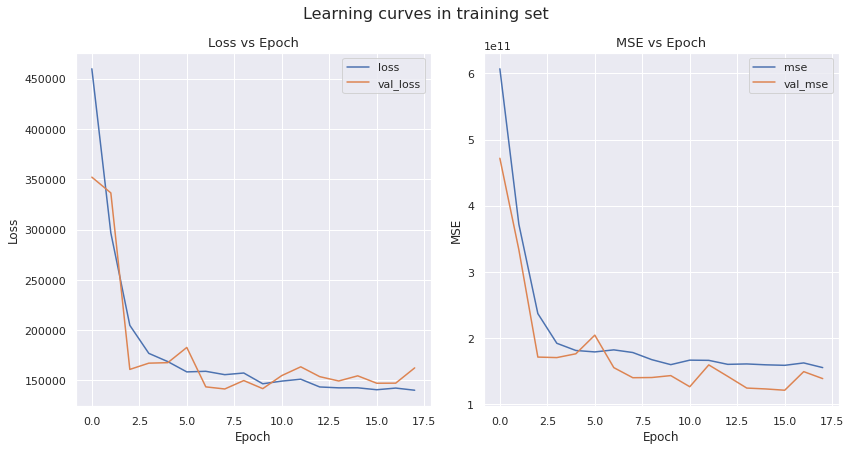

In [ ]:
# create figure (fig), and array of axes (ax)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Learning curves in training set', fontsize=16, y=1.04)

sns.lineplot(x=df.index , y='loss', data=df, ax=ax[0], label='loss')
sns.lineplot(x=df.index, y='val_loss', data=df, ax=ax[0], label='val_loss')
ax[0].set_title('Loss vs Epoch', fontsize=13)
ax[0].set_ylabel('Loss')
ax[0].set_xlabel('Epoch')

sns.lineplot(x=df.index , y='mse', data=df, ax=ax[1], label='mse')
sns.lineplot(x=df.index, y='val_mse', data=df, ax=ax[1], label='val_mse')
ax[1].set_title('MSE vs Epoch', fontsize=13)
ax[1].set_ylabel('MSE')
ax[1].set_xlabel('Epoch')

plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
# Load best weight before fine tuning
model.load_weights(checkpoint_path)

#### Prediccion

In [ ]:
precios = []
test_dataset = test_dataset.batch(1)
for element in test_dataset.as_numpy_iterator():
  precios.append(model.predict(element)[0][0])

In [ ]:
print('minimo = ', np.min(precios))
print('maximo = ', np.max(precios))

minimo =  106992.89
maximo =  1199878.1


In [ ]:
data_predic = data_test.copy()
data_predic['precio'] = precios
data_predic['precio'] = data_predic['precio'].astype('int')
data_predic['id'] = data_predic['id'].astype('string')
data_predic.to_excel('predicciones.xls', columns=['id', 'precio'], index=False)

In [ ]:
# Borrar los pesos
!rm -rf checkpoint_model 